## **SMART LEGAL CASE CLASSIFIER WITH EXPLAINABILITY AND RETRIEVAL**

---
### **PROJECT BY: ALAISSA SHAIKH - DATA SCIENTIST**


---




#### **PROJECT AIM**: To develop a comprehensive, intelligent NLP system for Legal Case Classification, enriched with semantic similarity search, summarization, topic modeling, and explainability, to assist legal professionals in understanding and retrieving relevant case information efficiently.


---



#### **PROJECT OBJECTIVES**:


1.   **Legal Text Classification** : Fine-tune a BERT-based model to classify legal cases based on issue_area using court judgment facts.



2.   **Summarization of Legal Cases** : Utilize BART to generate concise summaries of verbose case descriptions, enhancing readability and comprehension.


2.   **Semantic Similarity Search**: Implement SBERT to retrieve and recommend similar past cases based on a new case query.


2.   **Topic Modeling with BERTopic** : Identify underlying topics and themes in legal case data to help categorize and explore large legal corpora.


2.   **Explainability using SHAP** : Integrate model explainability to show feature contributions behind BERT’s classification, enhancing transparency.


2.   **Modular Interface** : Provide a CLI (Command Line Interface) or API-based access to allow lawyers or data analysts to use the system in real-time.


2.   **Optional Enhancements**: Keyword extraction (KeyBERT), Tag recommendations, Visualization of topic trends over time





---



### **1. Install Required Libraries**

**Why?**

We install libraries for:

*  **Transformers**: BERT model and tokenizer

*  **Scikit-learn**: data splitting, evaluation

*  **Sentence** Transformers: for similarity search

*  **BERTopic**: topic modeling

*  **SHAP**: explainability

*  **BeautifulSoup**: clean HTML in text

In [71]:
# !pip install transformers datasets scikit-learn sentence-transformers bertopic umap-learn hdbscan shap bs4 -q

### **2. Load and Preprocess the Dataset**

**Why?**

Cleaning ensures that irrelevant or malformed inputs (like HTML tags or missing values) don't confuse the model.

In [72]:
import pandas as pd
from bs4 import BeautifulSoup

df = pd.read_csv('/content/justice.csv')
df = df.dropna(subset=['facts', 'issue_area'])
df['facts'] = df['facts'].str.strip()
df['cleaned_facts'] = df['facts'].apply(lambda x: BeautifulSoup(x, "html.parser").get_text())

### **3. Encode Labels**

**Why?**

BERT expects numerical labels for classification tasks. This maps each legal issue area to a numeric ID.

In [73]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['issue_area'])

### **4. Split the Dataset**

**Why?**

Splitting helps evaluate the model's performance on unseen data.

In [74]:
from sklearn.model_selection import train_test_split

train_texts, val_texts, train_labels, val_labels = train_test_split(
    df['cleaned_facts'].tolist(),
    df['label'].tolist(),
    test_size=0.2,
    stratify=df['label'],
    random_state=42
)

### **5. Tokenization using BERT**

**Why?**

Tokenization converts text into the format BERT understands: token IDs and attention masks.

In [75]:
from transformers import BertTokenizer

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
train_encodings = tokenizer(train_texts, truncation=True, padding=True, max_length=512)
val_encodings = tokenizer(val_texts, truncation=True, padding=True, max_length=512)

### **6. Dataset Wrapper for PyTorch**

**Why?**

Trainer API from Hugging Face requires data in PyTorch Dataset format.

In [76]:
from torch.utils.data import Dataset
import torch

class LegalDataset(Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __len__(self):
        return len(self.labels)
    def __getitem__(self, idx):
        return {
            'input_ids': torch.tensor(self.encodings['input_ids'][idx]),
            'attention_mask': torch.tensor(self.encodings['attention_mask'][idx]),
            'labels': torch.tensor(self.labels[idx])
        }

### **7. Load Pretrained BERT Model**

**Why?**

We fine-tune BERT to classify case facts into issue areas.

In [77]:
from transformers import BertForSequenceClassification

num_labels = len(set(df['label']))
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=num_labels)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


### **8. Define Training Arguments**

**Why?**

Controls training duration, batch size, evaluation frequency, and logging.

In [78]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    warmup_steps=100,
    weight_decay=0.01,
    eval_strategy='epoch',
    logging_dir='./logs',
    logging_steps=10,
)

### **9. Train the Model**

**Why?**

This fine-tunes BERT using the Hugging Face Trainer for simplicity.

In [79]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=LegalDataset(train_encodings, train_labels),
    eval_dataset=LegalDataset(val_encodings, val_labels)
)
trainer.train()

Epoch,Training Loss,Validation Loss
1,1.208800,1.143306
2,0.878100,1.053765
3,0.415300,1.011455


TrainOutput(global_step=948, training_loss=1.0959228236966998, metrics={'train_runtime': 859.9609, 'train_samples_per_second': 8.819, 'train_steps_per_second': 1.102, 'total_flos': 1995649238237184.0, 'train_loss': 1.0959228236966998, 'epoch': 3.0})

### **10. Evaluate Performance**

**Why?**

To assess the model’s precision, recall, and accuracy.

                    precision    recall  f1-score   support

         Attorneys       0.00      0.00      0.00         7
      Civil Rights       0.67      0.76      0.72       114
Criminal Procedure       0.84      0.87      0.85       172
       Due Process       0.57      0.31      0.40        26
 Economic Activity       0.72      0.82      0.77       109
  Federal Taxation       0.53      0.80      0.64        10
        Federalism       0.69      0.36      0.47        25
   First Amendment       0.78      0.87      0.82        71
    Judicial Power       0.38      0.31      0.34        68
     Miscellaneous       0.00      0.00      0.00         4
           Privacy       0.70      0.50      0.58        14
    Private Action       0.00      0.00      0.00         1
            Unions       0.47      0.67      0.55        12

          accuracy                           0.71       633
         macro avg       0.49      0.48      0.47       633
      weighted avg       0.69      0.7

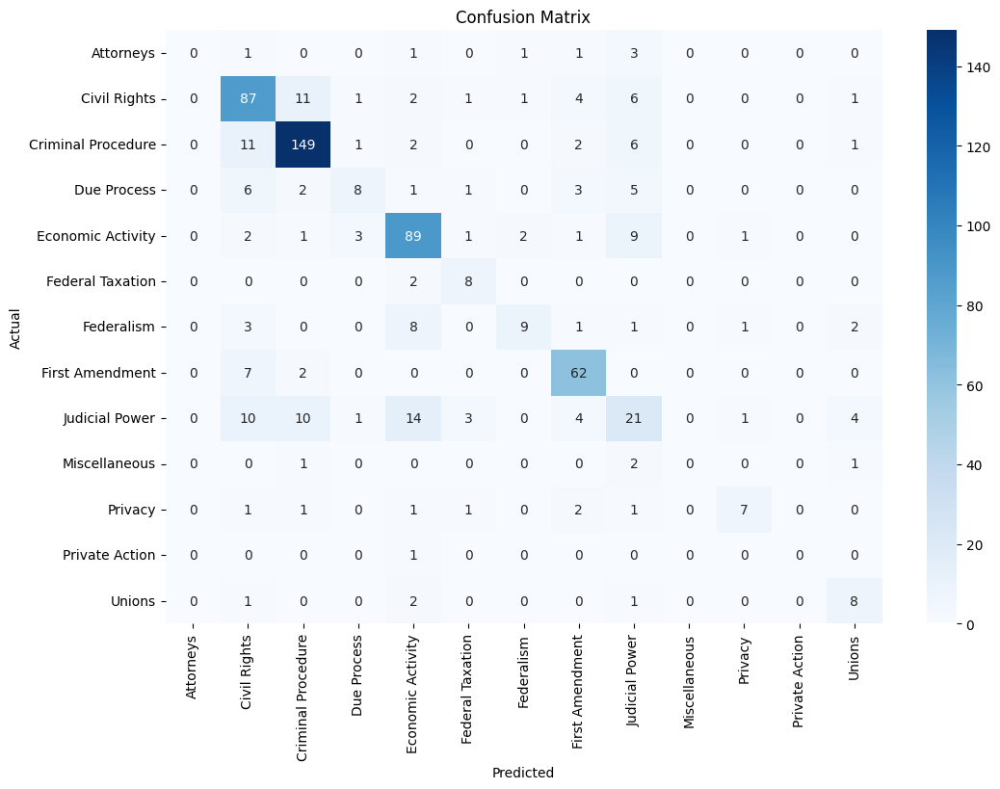

In [81]:
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

preds = trainer.predict(LegalDataset(val_encodings, val_labels))
y_pred = preds.predictions.argmax(axis=1)

# Get the unique labels present in the validation set
unique_labels_val = set(val_labels)

# Filter label_encoder.classes_ to include only the labels present in the validation set
target_names = [label for label in label_encoder.classes_ if label_encoder.transform([label])[0] in unique_labels_val]

# Print the classification report with the filtered target names
print(classification_report(val_labels, y_pred, target_names=target_names))

cm = confusion_matrix(val_labels, y_pred, labels=np.unique(val_labels)) # Update confusion matrix
plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=target_names, yticklabels=target_names, cmap='Blues') # Update heatmap
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()



*   The model achieves a decent overall accuracy of 71%.
However, the macro average scores are lower than the weighted average, which often indicates that the model performs better on the classes with more support (like "Civil Rights" and "Criminal Procedure") and struggles with less frequent classes.

*   The very low (or zero) precision, recall, and F1-scores for "Attorneys," "Miscellaneous," and "Private Action" highlight that the model is failing to correctly classify these categories. This could be due to very few examples in the data (low support) or the features not being discriminative enough for these classes.

*   There's a noticeable difference between precision and recall for some categories, suggesting potential imbalances in the types of errors the model is making. For example, "Federal Taxation" has a high recall (0.80) but a lower precision (0.53), meaning it's correctly identifying most of the "Federal Taxation" instances but is also incorrectly classifying other instances as "Federal Taxation."



### **11. Save Model and Label Encoder**

In [82]:
model.save_pretrained("./results")
tokenizer.save_pretrained("./results")

import joblib
joblib.dump(label_encoder, "label_encoder.pkl")


['label_encoder.pkl']

### **12. Predict on New Input**

**Why?**

Enables real-time prediction of the legal issue for new cases.

In [83]:
def predict_issue(text):
    tokens = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    tokens = {k: v.to(model.device) for k, v in tokens.items()}
    output = model(**tokens)
    pred = torch.argmax(output.logits, dim=1)
    return label_encoder.inverse_transform([pred.item()])[0]

text = input("Enter case facts: ")
print("Predicted Issue Area:", predict_issue(text))

Enter case facts: dead
Predicted Issue Area: First Amendment


### **13. Case Similarity Search**

**Why?**

Retrieve similar past cases to assist in legal reasoning.

In [100]:
from sentence_transformers import SentenceTransformer, util

sbert_model = SentenceTransformer('all-MiniLM-L6-v2')
corpus_embeddings = sbert_model.encode(df['cleaned_facts'].tolist(), convert_to_tensor=True)

def search_similar_cases(query_text, top_k=5):
    query_embedding = sbert_model.encode(query_text, convert_to_tensor=True)
    cos_scores = util.pytorch_cos_sim(query_embedding, corpus_embeddings)[0]
    top_results = torch.topk(cos_scores, k=top_k)
    for score, idx in zip(top_results[0], top_results[1]):
        # Convert idx to a Python integer using .item()
        print(f"Issue: {df.iloc[idx.item()]['issue_area']}\nScore: {score:.4f}\nText: {df.iloc[idx.item()]['cleaned_facts'][:300]}...\n")

In [101]:
search_similar_cases("Illegal termination of employment due to discrimination", top_k=3)

Issue: Civil Rights
Score: 0.5559
Text: Under Title VII of the Civil Rights Act of 1964, it is unlawful "for an employer to discriminate against any of his employees...because [the employee] has opposed any practice made an unlawful employment practice by [Title VII], or because [the employee] has made a charge, testified, assisted, or pa...

Issue: Civil Rights
Score: 0.5473
Text: In 1990, Darlene Walters was fired by Metropolitan Educational Enterprises, Inc. (Metropolitan). Soon thereafter, Walters filed an employment discrimination charge against Metropolitan under Title VII of the Civil Rights Act of 1964 with the Equal Employment Opportunity Commission (EEOC). The EEOC s...

Issue: Judicial Power
Score: 0.5373
Text: In 2007, Stephanie Artis was employed by the District of Columbia Department of Health (DOH) as a code inspector. She alleges that she and her supervisor developed a contentious relationship and that he singled her out for unfair treatment in the workplace. On April 1

### **14. Summarization with BART**

**Why?**

Helps quickly grasp the essence of long legal texts.

In [85]:
from transformers import BartForConditionalGeneration, BartTokenizer

bart_tokenizer = BartTokenizer.from_pretrained("facebook/bart-large-cnn")
bart_model = BartForConditionalGeneration.from_pretrained("facebook/bart-large-cnn")

def summarize_case(text):
    inputs = bart_tokenizer([text], max_length=1024, return_tensors="pt", truncation=True)
    summary_ids = bart_model.generate(inputs['input_ids'], max_length=150, min_length=30, num_beams=4, early_stopping=True)
    return bart_tokenizer.decode(summary_ids[0], skip_special_tokens=True)

In [97]:
sample_case = """
The plaintiff entered into an agreement with the defendant for the supply of raw materials over a period of 12 months.
However, the defendant failed to deliver the agreed quantities and did not respond to repeated communication attempts.
The plaintiff suffered significant financial losses due to this breach and is seeking damages under the applicable contract law provisions.
"""

summary = summarize_case(sample_case)
print("🔍 Case Summary:\n", summary)

🔍 Case Summary:
 The plaintiff entered into an agreement with the defendant for the supply of raw materials over a period of 12 months. The defendant failed to deliver the agreed quantities and did not respond to repeated communication attempts. The plaintiff suffered significant financial losses due to this breach.


### **15. Explainability with SHAP**

**Why?**

Visualize which words influenced BERT's decision.

In [86]:
import shap
from transformers import TextClassificationPipeline

pipeline = TextClassificationPipeline(model=model, tokenizer=tokenizer, return_all_scores=True)
explainer = shap.Explainer(pipeline, tokenizer)
sample_text = df['cleaned_facts'].iloc[0]
shap_values = explainer([sample_text])
shap.plots.text(shap_values[0])

Device set to use cuda:0


  0%|          | 0/498 [00:00<?, ?it/s]

### **16. Topic Modeling with BERTopic**

**Why?**

Discover hidden themes in legal texts. Useful for exploration and clustering.

In [87]:
from bertopic import BERTopic

topic_model = BERTopic(embedding_model=SentenceTransformer("all-MiniLM-L6-v2"), verbose=True)
topics, probs = topic_model.fit_transform(df['cleaned_facts'].tolist())
df['topic'] = topics
topic_model.visualize_topics()

2025-04-16 07:32:31,444 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/99 [00:00<?, ?it/s]

2025-04-16 07:32:39,900 - BERTopic - Embedding - Completed ✓
2025-04-16 07:32:39,901 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-04-16 07:32:54,500 - BERTopic - Dimensionality - Completed ✓
2025-04-16 07:32:54,502 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-04-16 07:32:54,632 - BERTopic - Cluster - Completed ✓
2025-04-16 07:32:54,638 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-04-16 07:32:55,073 - BERTopic - Representation - Completed ✓


In [104]:
for topic_num in range(5):
    print(f"Topic {topic_num}: {topic_model.get_topic(topic_num)}\n")

Topic 0: [('school', np.float64(0.04859556941930771)), ('the', np.float64(0.021524480713840603)), ('education', np.float64(0.018573941160623608)), ('schools', np.float64(0.018486620785901135)), ('students', np.float64(0.0182361098160781)), ('of', np.float64(0.018231643029296963)), ('district', np.float64(0.017053390293589)), ('to', np.float64(0.01667408802236158)), ('and', np.float64(0.0163404264529951)), ('in', np.float64(0.015472291285970876))]

Topic 1: [('patent', np.float64(0.04579796390087075)), ('infringement', np.float64(0.020583390831606138)), ('the', np.float64(0.019374128273014445)), ('that', np.float64(0.01845762232271749)), ('and', np.float64(0.017718781341603873)), ('patents', np.float64(0.01635512934844412)), ('for', np.float64(0.016170450776712177)), ('to', np.float64(0.016147591700667357)), ('of', np.float64(0.016110236546035335)), ('in', np.float64(0.015526114128971119))]

Topic 2: [('search', np.float64(0.043114050975083175)), ('police', np.float64(0.0283060156471416

### **17. Exploratory Data Analysis (Optional but Valuable)**



<Axes: xlabel='term', ylabel='issue_area'>

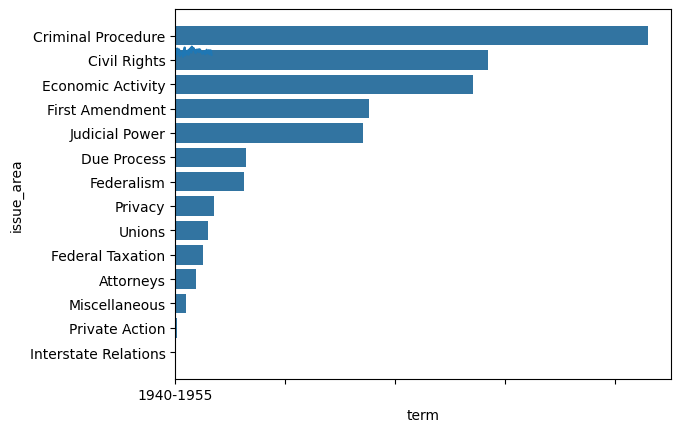

In [88]:
sns.countplot(data=df, y='issue_area', order=df['issue_area'].value_counts().index)
df.groupby('term')['first_party_winner'].mean().plot(kind='line')



*   Criminal Procedure is by far the most frequent issue area during 1940-1955, as it has the longest bar.
Civil Rights and Economic Activity also appear to be quite prominent during *   this period, with relatively long bars.

*   Issue areas like Federalism, Due Process, Judicial Power, and First Amendment have moderate frequencies.

*   Categories such as Privacy, Unions, Federal Taxation, Attorneys, Miscellaneous, Private Action, and Interstate Relations are the least frequent within this specific timeframe, as indicated by their very short bars.



### **18. Gradio or FastAPI Interface**

In [91]:
# !pip install gradio
import gradio as gr

gr.Interface(fn=predict_issue, inputs="text", outputs="text").launch()

It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://2fc50a908c0b70d157.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


### **19. Model Confidence Scoring**

In [95]:
def predict_confidence(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    # Move inputs to the same device as the model
    inputs = {k: v.to(model.device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)

    probs = torch.nn.functional.softmax(outputs.logits, dim=-1)
    confidence, predicted_class = torch.max(probs, dim=1)

    predicted_label = label_encoder.inverse_transform([predicted_class.item()])[0]
    confidence_score = round(confidence.item() * 100, 2)

    return {
        "Predicted Issue": predicted_label,
        "Confidence (%)": confidence_score
    }

In [96]:
sample_text = "The plaintiff claims breach of contract for failure to deliver goods as per the agreement."

result = predict_confidence(sample_text)
print(result)

{'Predicted Issue': 'Economic Activity', 'Confidence (%)': 89.73}


## **20. Data Visualizations**


###  **1. Topic Overview (Interactive Bubble Chart)**

In [106]:
topic_model.visualize_topics()



*   The number of distinct topics identified.
*   The relative size or importance of each topic.
*   The semantic relationships and overlap between the topics



### **2. Topic Bar Chart**

In [107]:
topic_model.visualize_barchart(top_n_topics=10)

### **3. Topic Heatmap**

In [108]:
topic_model.visualize_heatmap()

### **4. Topic Reduction Tree**

In [109]:
topic_model.visualize_hierarchy()



*   Similarity: Items that are joined together earlier (closer to the left) are more similar to each other than items joined later (further to the right). For example, the items within the top green cluster are more similar to each other than they are to any of the items in the red cluster.

*   Clusters: By looking at where the major branches form, you can identify distinct groups or clusters of similar items. The coloring helps to visually separate these main clusters. Based on the blue lines, it seems the analysis might be suggesting two primary clusters.

*   Dissimilarity: The length of the horizontal branches can be used to gauge the dissimilarity between clusters. The long horizontal branch connecting the green and red clusters indicates that these two main groups are quite different from each other.

*   Individual Item Relationships: You can trace the branches down to see which individual documents are most similar. For example, "42_batson_challenges_ayala_-" and "36_puerto_rico_money_-" are grouped together relatively early, suggesting they are more similar to each other than to "5_immigration_united_states_-".


### **5. Top Words per Topic**

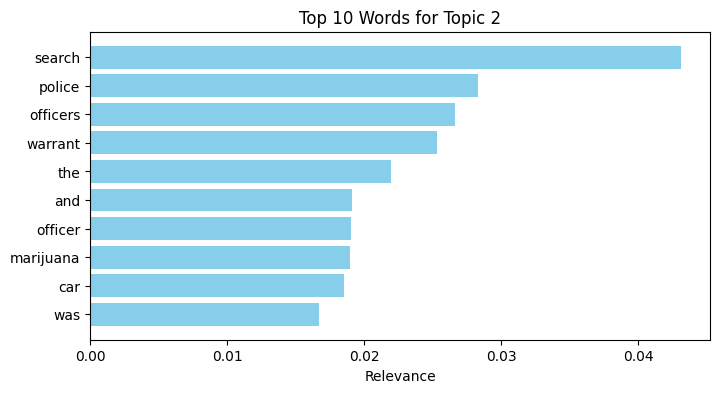

In [111]:
import matplotlib.pyplot as plt

def plot_topic_words(topic_id, top_n=10):
    words = topic_model.get_topic(topic_id)[:top_n]
    labels, weights = zip(*words)
    plt.figure(figsize=(8, 4))
    plt.barh(labels, weights, color="skyblue")
    plt.gca().invert_yaxis()
    plt.title(f"Top {top_n} Words for Topic {topic_id}")
    plt.xlabel("Relevance")
    plt.show()

plot_topic_words(2)  # Example topic

### **6. Embedding Clusters with UMAP**

In [112]:
fig = topic_model.visualize_documents(df['cleaned_facts'].tolist())
fig.show()

#### **CONCLUSION**: This project demonstrates the potential of NLP and deep learning in automating and enriching legal case analysis. By integrating BERT-based classification, semantic similarity search, summarization, and topic modeling, we’ve built a powerful tool for legal professionals to efficiently classify and explore case law. The inclusion of explainability techniques like SHAP further ensures that our models remain transparent and trustworthy in sensitive legal applications.


---


#### The modular architecture—designed with real-world usability in mind—offers scalable opportunities for further integration into legal tech platforms. This project not only simplifies legal information retrieval but also supports data-driven decision-making in the justice system.

---



---

